In [1]:
import anndata as ad
import scanpy as sc
import scvi
import os
import pandas as pd
import numpy as np
import scarches as sca
os.chdir('/lustre/scratch126/cellgen/team297/bs16/current_projects/kidney_glomTI_response/code')
import useful_functions as uf
import sys
print(sys.executable)
import gdown
import torch
import warnings
#warnings
warnings.simplefilter(action='ignore')
#figures
sc.set_figure_params(frameon=False, figsize=(4, 4), dpi=150, fontsize = 5)
#set seeds for reproducibility
scvi.settings.seed = 100
#torch
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

from datetime import datetime
print(datetime.now(tz=None))

/nfs/team297/bs16/tools/conda_envs/scvi-env/lib/python3.9/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: '/nfs/team297/bs16/tools/conda_envs/scvi-env/lib/python3.9/site-packages/torchvision/image.so: undefined symbol: _ZN3c104cuda20CUDACachingAllocator9allocatorE'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
Global seed set to 0
/nfs/team297/bs16/tools/conda_envs/scvi-env/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/nfs/team297/bs16/tools/con

/nfs/team297/bs16/tools/conda_envs/scvi-env/bin/python3.9
2023-07-03 11:59:29.066585


In [2]:
import warnings
warnings.filterwarnings('ignore')
#this will hide the awful pandas deprec warnings that are currently plaguing scanpy

#now print versions
print(sc.__version__)
print(ad.__version__)
print(scvi.__version__)
print(pd.__version__)
print(np.__version__)
print(sca.__version__)
print(torch.__version__)

1.9.1
0.8.0
0.19.0
1.5.1
1.23.5
0.5.6
1.13.0+cu117


In [3]:
os.chdir('/lustre/scratch126/cellgen/team297/bs16/current_projects/kidney_glomTI_response')
adata = sc.read_h5ad("data/raw/10X_3p/healthy_raw.h5ad")

In [4]:
adata.obs['source'].value_counts()

NHSBT_frozen          201797
CBTM_frozen            32845
CBTM_fresh             29361
TXN_frozen             24320
NHSBT_fresh            16622
Tumour_nephrectomy      2408
Name: source, dtype: int64

In [5]:
#select NHSBT kidney tissue
#adata = adata[adata.obs['source'].isin(['NHSBT_frozen', 'TXN_frozen', 'Tumour_nephrectomy', 'CBTM_frozen'])]
adata = adata[adata.obs['source'].isin(['NHSBT_frozen', 'Tumour_nephrectomy'])]

In [6]:
adata.obs['anatomy'].value_counts()

kidney_cortex    187229
kidney            16976
Name: anatomy, dtype: int64

In [7]:
adata = adata[adata.obs['anatomy'].isin(['kidney', 'kidney_cortex'])]

In [8]:
pd.crosstab(adata.obs['tissue_process'], adata.obs['source'])

source,NHSBT_frozen,Tumour_nephrectomy
tissue_process,,
fresh_tissue,0,2408
frozen_tissue,201797,0


In [9]:
#purge the doublets
adata = adata[adata.obs['dblf_cuts'].isin(['singlet'])]
adata = adata[adata.obs['status'].isin(['singlet'])]
adata = adata[adata.obs['dblf_genotype_predicted'].isin(['singlet'])]
adata = adata[adata.obs['dblf_weighted'] < 0.6]
adata

View of AnnData object with n_obs × n_vars = 178621 × 31915
    obs: 'barcode', 'path', '_scvi_batch', '_scvi_labels', 'channel', 'status', 'assignment', 'genotype', 'SOC_cluster', 'donor', 'date', 'submission_channel', 'sequencing_sample_name', 'sanger_ID', 'tissue', 'poor_QC', 'experiment', 'tissue_dissociation_processing_batch', 'sequencing_batch', 'n_genotypes', 'anatomy', 'sanger_study', 'source', 'tissue_process', 'perturbation_timepoint', 'age', 'sex', 'CASM_ID', 'Status', 'cellranger_SOC', 'HMDMC', 'irods_dir', 'irods_ID', '10xDIR', 'tissue_type', 'laterality', 'donor_age', 'donor_sex', 'CIT_at_processing', 'fresh.frozen', 'perfused', 'transplant_detail', 'admission_creatinine', 'last_creatinine', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'depth', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', '

In [10]:
donor_map = {"GPD1" : "GPD1", "K232" : "K232", "K241" : "K241", "K245":"K245" , "K247" : "K247",
                 "K250" : "K250_K251",  "K251" : "K250_K251", "K254" : "K254", "K255" : "K255",
                 "K257" : "K257", "K260" : "K260", "K262" : "K262", "K269" : "K269",
                 "K270" : "K270", "K271" : "K271", "K272" : "K272", "K273" : "K273",  
                 "K275" : "K275", "K277" : "K277", "K278" : "K278", "K294" : "K294", 
                 "TXN10-donor" : "TXN10", "TXN10-recipient" : "TXN10"}
# add a new `.obs` column called `cell type` by mapping clusters to annotation using pandas `map` function
adata.obs['donor'] = adata.obs['genotype'].map(donor_map).astype('category')

In [11]:
adata

AnnData object with n_obs × n_vars = 178621 × 31915
    obs: 'barcode', 'path', '_scvi_batch', '_scvi_labels', 'channel', 'status', 'assignment', 'genotype', 'SOC_cluster', 'donor', 'date', 'submission_channel', 'sequencing_sample_name', 'sanger_ID', 'tissue', 'poor_QC', 'experiment', 'tissue_dissociation_processing_batch', 'sequencing_batch', 'n_genotypes', 'anatomy', 'sanger_study', 'source', 'tissue_process', 'perturbation_timepoint', 'age', 'sex', 'CASM_ID', 'Status', 'cellranger_SOC', 'HMDMC', 'irods_dir', 'irods_ID', '10xDIR', 'tissue_type', 'laterality', 'donor_age', 'donor_sex', 'CIT_at_processing', 'fresh.frozen', 'perfused', 'transplant_detail', 'admission_creatinine', 'last_creatinine', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'depth', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_co

In [12]:
# Compute HVG per batch
nvar = 2000
sc.pp.highly_variable_genes(adata, n_top_genes = nvar, flavor='seurat_v3', subset = False, 
                            layer = 'raw_counts',
                           batch_key = 'sequencing_batch')

# Sort by how many times a gene is marked as HVG and select top genes
hvg = adata.var.sort_values('highly_variable_nbatches').tail(nvar).index
# Update gene's metadata
adata.var['highly_variable'] = [g in hvg for g in adata.var.index]

In [13]:
#call highly variable genes
#nvar = 2000
#sc.pp.highly_variable_genes(adata, n_top_genes = nvar, flavor='seurat_v3', subset = False, layer = 'raw_counts')

In [14]:
adata.uns['raw_adata'] = adata.copy() #this lets us get the rawcounts later

In [15]:
#make X denoised "clean" counts
adata.X = adata.layers['denoised_counts']
#normalise and log transform
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
#then we can use raw for plotting

In [16]:
adata.raw = adata.copy()

In [17]:
adata

AnnData object with n_obs × n_vars = 178621 × 31915
    obs: 'barcode', 'path', '_scvi_batch', '_scvi_labels', 'channel', 'status', 'assignment', 'genotype', 'SOC_cluster', 'donor', 'date', 'submission_channel', 'sequencing_sample_name', 'sanger_ID', 'tissue', 'poor_QC', 'experiment', 'tissue_dissociation_processing_batch', 'sequencing_batch', 'n_genotypes', 'anatomy', 'sanger_study', 'source', 'tissue_process', 'perturbation_timepoint', 'age', 'sex', 'CASM_ID', 'Status', 'cellranger_SOC', 'HMDMC', 'irods_dir', 'irods_ID', '10xDIR', 'tissue_type', 'laterality', 'donor_age', 'donor_sex', 'CIT_at_processing', 'fresh.frozen', 'perfused', 'transplant_detail', 'admission_creatinine', 'last_creatinine', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'depth', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_co

In [18]:
#subset to HVG
adata = adata[:, adata.var['highly_variable']]
#exclude the core exclude genes
adata = adata[:,adata.var.core_exclude]
#adata

In [19]:
adata

View of AnnData object with n_obs × n_vars = 178621 × 1846
    obs: 'barcode', 'path', '_scvi_batch', '_scvi_labels', 'channel', 'status', 'assignment', 'genotype', 'SOC_cluster', 'donor', 'date', 'submission_channel', 'sequencing_sample_name', 'sanger_ID', 'tissue', 'poor_QC', 'experiment', 'tissue_dissociation_processing_batch', 'sequencing_batch', 'n_genotypes', 'anatomy', 'sanger_study', 'source', 'tissue_process', 'perturbation_timepoint', 'age', 'sex', 'CASM_ID', 'Status', 'cellranger_SOC', 'HMDMC', 'irods_dir', 'irods_ID', '10xDIR', 'tissue_type', 'laterality', 'donor_age', 'donor_sex', 'CIT_at_processing', 'fresh.frozen', 'perfused', 'transplant_detail', 'admission_creatinine', 'last_creatinine', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'depth', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 't

In [20]:
#calculate PCA
sc.pp.pca(adata)

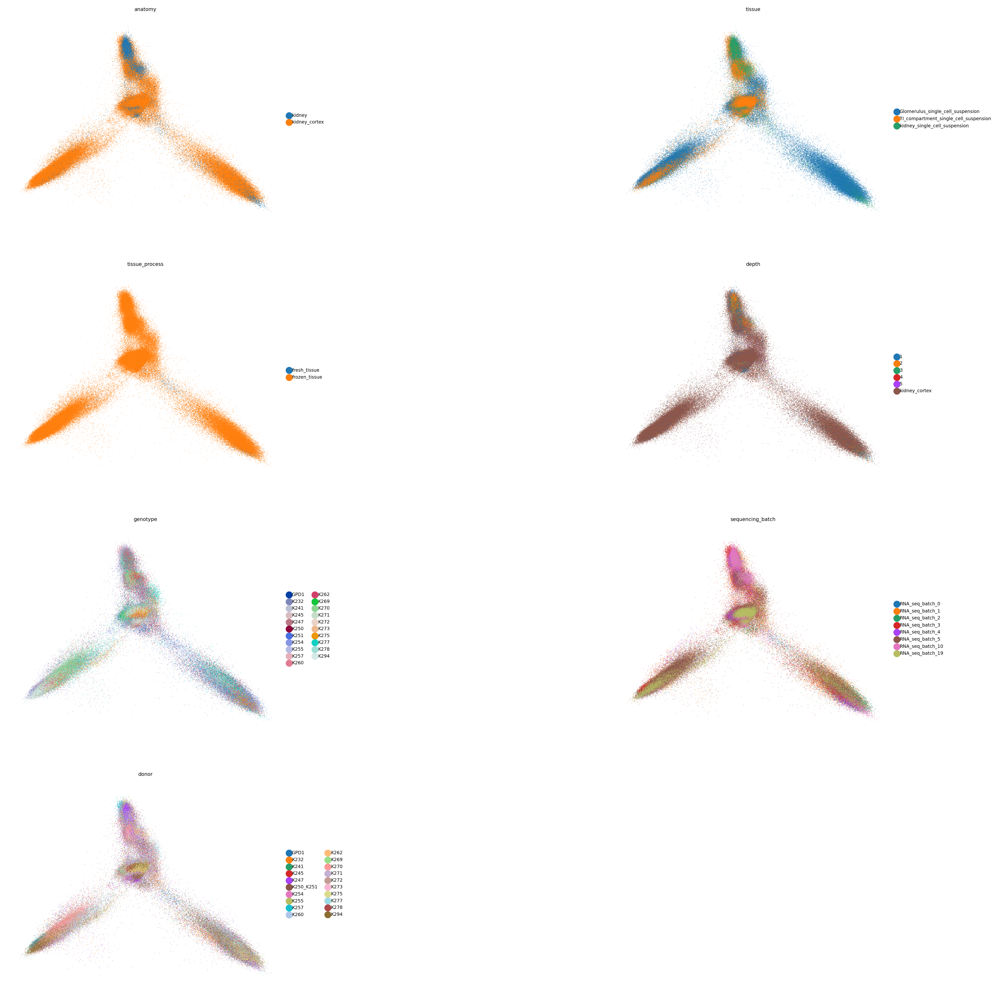

In [21]:
sc.pl.pca(adata, color = ['anatomy', 'tissue', 'tissue_process', 'depth', 'genotype', 'sequencing_batch', 'donor'], ncols =2, 
          wspace = 1)

In [22]:
adata = adata.copy()

In [23]:
#setup an SCVI model
scvi.model.SCVI.setup_anndata(adata, 
                           categorical_covariate_keys = ['donor', 'tissue'],
                              layer = 'raw_counts')

In [24]:
vae = sca.models.SCVI(adata, 
                      n_latent =15, 
                      n_layers = 2, 
                encode_covariates=True,
                deeply_inject_covariates=False,
                use_layer_norm="both",
                use_batch_norm="none",

                      gene_likelihood = 'nb')

In [25]:
vae.view_anndata_setup(adata)

Anndata setup with scvi-tools version 0.19.0.

Setup via `SCVI.setup_anndata` with arguments:

{
│   'layer': 'raw_counts',
│   'batch_key': None,
│   'labels_key': None,
│   'size_factor_key': None,
│   'categorical_covariate_keys': ['donor', 'tissue'],
│   'continuous_covariate_keys': None
}

         Summary Statistics          
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃     Summary Stat Key     ┃ Value  ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩
│         n_batch          │   1    │
│         n_cells          │ 178621 │
│ n_extra_categorical_covs │   2    │
│ n_extra_continuous_covs  │   0    │
│         n_labels         │   1    │
│          n_vars          │  1846  │
└──────────────────────────┴────────┘

                             Data Registry                             
┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Registry Key      ┃            scvi-tools Location             ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           X            │         adata.layers['raw_counts']         │
│         batch          │          adata.obs['_scvi_batch']          │
│ extra_categorical_covs │ adata.obsm['_scvi_extra_categorical_covs'] │
│         labels         │         adata.obs['_scvi_labels']          │
└────────────────────────┴────────────────────────────────────────────┘

                     batch State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃     Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_batch'] │     0      │          0          │
└──────────────────────────┴────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

                        extra_categorical_covs State Registry                        
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃              Categories               ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['donor']  │                 GPD1                  │          0          │
│                     │                 K232                  │          1          │
│                     │                 K241                  │          2          │
│                     │                 K245                  │          3          │
│                     │                 K247                  │          4          │
│                     │               K250_K251               │          5          │
│                     │                 K254                  │          6          │
│                     │                 K255                  │          7          │
│                     │                 K257                  │          8          │
│                     │                 K260                  │          9          │
│                     │                 K262                  │         10          │
│                     │                 K269                  │         11          │
│                     │                 K270                  │         12          │
│                     │                 K271                  │         13          │
│                     │                 K272                  │         14          │
│                     │                 K273                  │         15          │
│                     │                 K275                  │         16          │
│                     │                 K277                  │         17          │
│                     │                 K278                  │         18          │
│                     │                 K294                  │         19          │
│                     │                                       │                     │
│ adata.obs['tissue'] │   Glomerulus_single_cell_suspension   │          0          │
│                     │ TI_compartment_single_cell_suspension │          1          │
│                     │     kidney_single_cell_suspension     │          2          │
│                     │                                       │                     │
└─────────────────────┴───────────────────────────────────────┴─────────────────────┘

In [26]:
vae.train(early_stopping = True)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 45/45: 100%|██████████| 45/45 [10:02<00:00, 13.37s/it, loss=360, v_num=1]

`Trainer.fit` stopped: `max_epochs=45` reached.


Epoch 45/45: 100%|██████████| 45/45 [10:02<00:00, 13.39s/it, loss=360, v_num=1]


In [27]:
adata.obsm['X_scVI'] = vae.get_latent_representation()

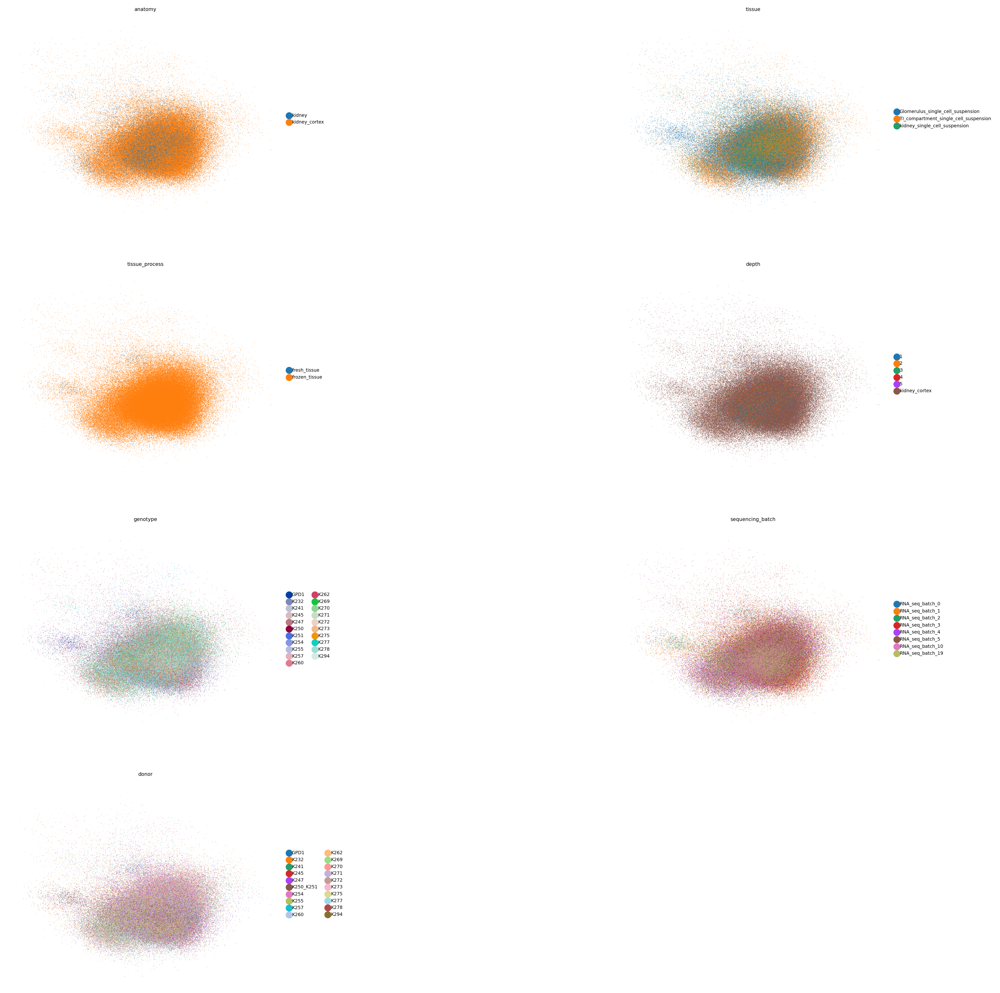

In [28]:
sc.pl.embedding(adata,basis = "X_scVI", color = ['anatomy', 'tissue', 'tissue_process', 'depth', 'genotype', 'sequencing_batch', 'donor'], ncols =2, 
          wspace = 1)

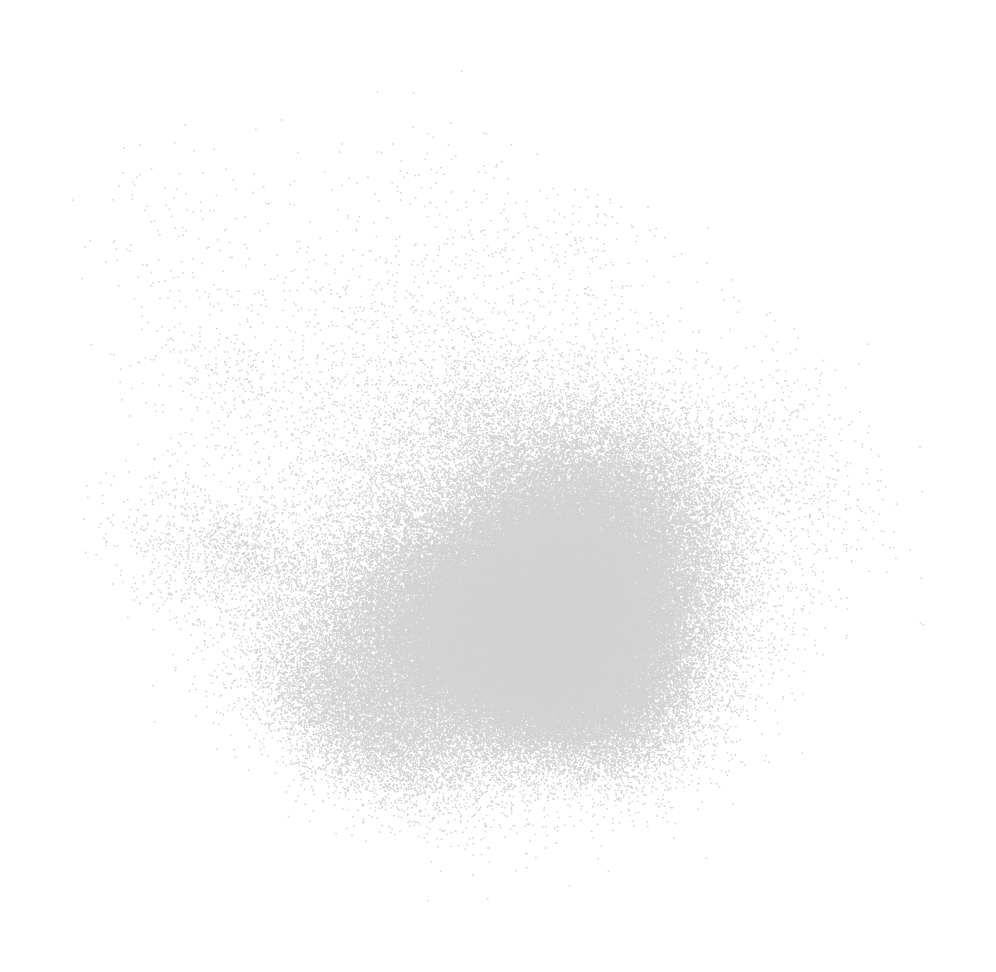

In [29]:
sc.pl.embedding(adata,basis = "X_scVI")

In [30]:
adata.layers["normalized_scVI"] = vae.get_normalized_expression()

In [31]:
os.chdir('/lustre/scratch126/cellgen/team297/bs16/current_projects/kidney_glomTI_response/data/trained/10X_3p')
vae.save("scvi_atlas_model/", overwrite=True, save_anndata = True)

In [32]:
#do celltypist
import celltypist
print(celltypist.__version__)
os.chdir('/lustre/scratch126/cellgen/team297/bs16/current_projects/kidney_glomTI_response')
celltypist_adata = sc.read_h5ad("data/raw/10X_3p/healthy_raw.h5ad")

1.4.0


In [33]:
#subset to the cells we have
celltypist_adata = celltypist_adata[adata.obs_names]

In [34]:
celltypist_adata.obsm['X_scVI'] = adata.obsm['X_scVI']
sc.pp.neighbors(celltypist_adata, use_rep = 'X_scVI')

In [35]:
#counts and normalize total to 10K
sc.pp.normalize_total(celltypist_adata, target_sum = 10000)
sc.pp.log1p(celltypist_adata)
predictions = celltypist.annotate(celltypist_adata, model = 'data/celltypist/public_kidney_annotation_model.pkl',
                                 majority_voting = True)

In [36]:
adata.obs['celltypist_kidney_predicted'] = predictions.predicted_labels['majority_voting']

In [37]:
scanvae = scvi.model.SCANVI.from_scvi_model(
    vae,
    adata=adata,
    labels_key="celltypist_kidney_predicted", #use the celltypist predicted labels to help optimise the integration
    unlabeled_category="unknown",
)

In [38]:
scanvae.train(max_epochs=20, n_samples_per_label=100)

INFO     Training for 20 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 20/20: 100%|██████████| 20/20 [09:39<00:00, 29.00s/it, loss=462, v_num=1]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [09:39<00:00, 28.99s/it, loss=462, v_num=1]


In [39]:
adata.obsm["X_scANVI"] = scanvae.get_latent_representation(adata)

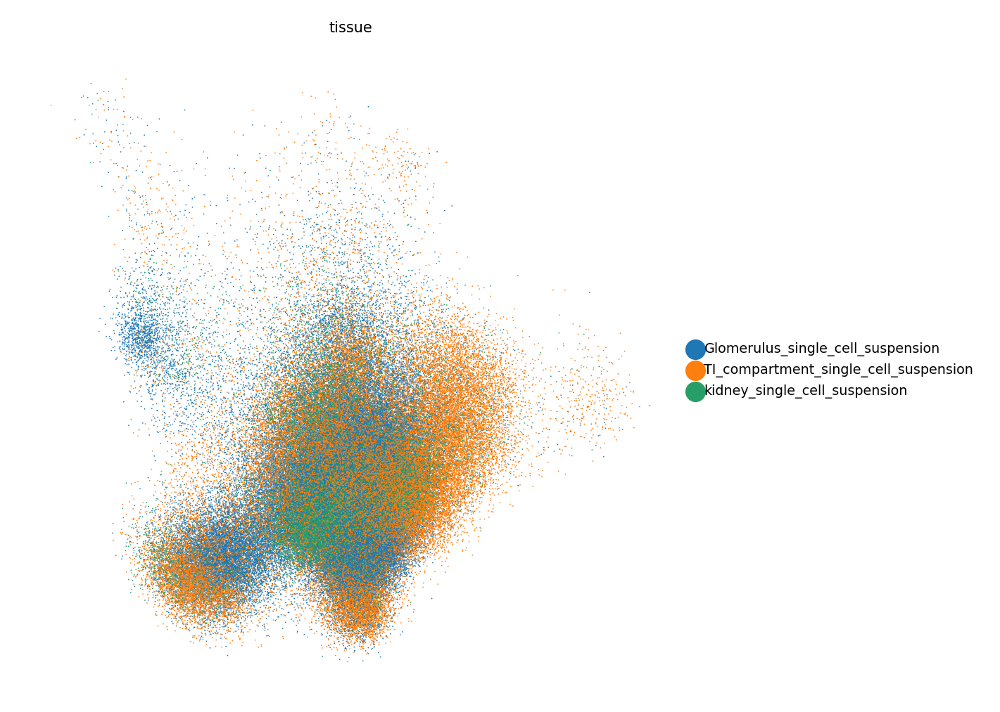

In [40]:
sc.pl.embedding(adata, basis = 'X_scANVI', color = 'tissue')

In [41]:
os.chdir('/lustre/scratch126/cellgen/team297/bs16/current_projects/kidney_glomTI_response/data/trained/10X_3p')
scanvae.save("scanvae_atlas_model/", overwrite=True, save_anndata = True)